In [1]:
import numpy as np
import plotly.express as px
import pandas as pd

import sys
import os
sys.path.append(os.path.dirname(os.path.dirname(os.getcwd())))

from sandwich_numerical.sandwich import Sandwich

## Assemble 2 meshes. $\mu = 1$ in one mesh and $\mu = 1000$ in another one

In [2]:
block_height = 21
mesh_height = block_height * 3
block_size = (block_height, 3000)
grid_step = 0.005
mu_1 = 1
mu_2 = 1000

base_grad_vec = np.sin((2 * np.pi) / (mesh_height-1) * np.arange(mesh_height))

grad_vec_1 = np.copy(base_grad_vec)
mesh_1 = Sandwich(
    block_size,
    grad_vec_1,
    grid_step,
    mu_1
)

grad_vec_1000 = np.copy(base_grad_vec)
# grad_vec_1000[block_size[0]:2*block_size[0]] *= mu_2
mesh_1000 = Sandwich(
    block_size,
    grad_vec_1000,
    grid_step,
    mu_2
)

Run 10_000 iterations on each mesh

In [3]:
def process_mesh(mesh, iter_count):
    residuals = []
    for i in range(iter_count):
        mesh.step()
        if i % 100_000 == 0:
            print(i)
            residuals.append((i, mesh.get_residual()))
            
    return residuals

In [4]:
iter_count = 10_000

residuals_1 = process_mesh(mesh_1, iter_count)
residuals_1000 = process_mesh(mesh_1000, iter_count)

0
0


Analyze the distributions of displacements

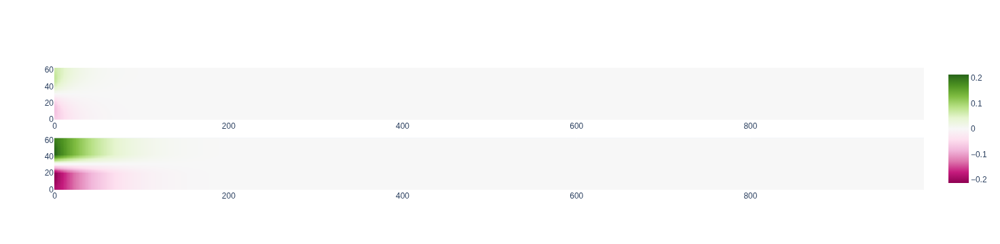

In [5]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=1)
fig.add_trace(px.imshow(mesh_1.get_displacement_array()[:, :1000]).data[0], row=1, col=1)
fig.add_trace(px.imshow(mesh_1000.get_displacement_array()[:, :1000]).data[0], row=2, col=1)

fig.update_layout()
fig.show()

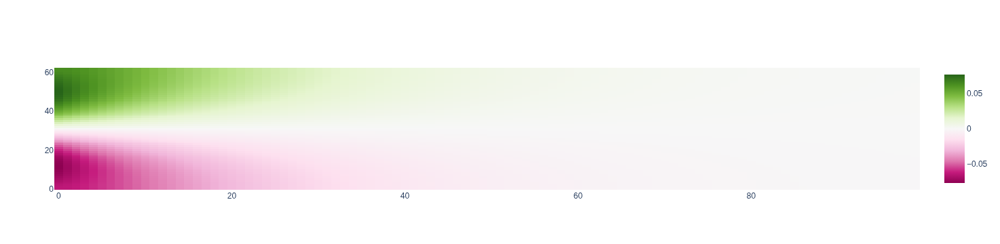

In [6]:
fig = make_subplots(rows=1, cols=1)
fig.add_trace(px.imshow(mesh_1.get_displacement_array()[:, :100]).data[0], row=1, col=1)

fig.update_layout()
fig.show()

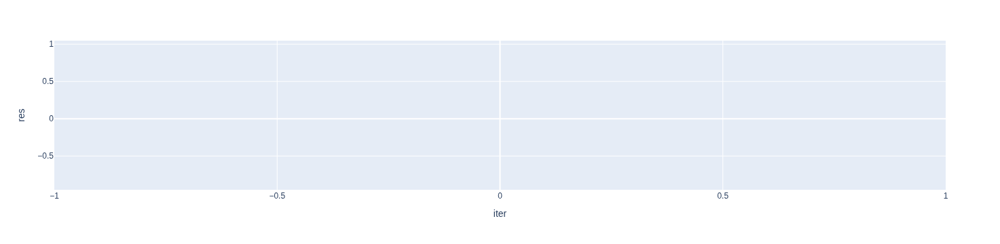

In [7]:
px.line(pd.DataFrame(residuals_1000, columns=['iter', 'res']), x='iter', y='res')

# Let's look at the cros section displacement distribution

In [8]:
def get_samples_df(mesh):
    displacement_data = mesh.get_displacement_array()
    
    sample_size = displacement_data.shape[0]
    return pd.DataFrame({
        'x2': np.arange(mesh_height) * grid_step,
        'x1=0.0': displacement_data[:, 0],
        'x1=0.2': displacement_data[:, 40],
        'x1=0.4': displacement_data[:, 80],
        'x1=1.0': displacement_data[:, 200]
    })

def plot_samples_data(mesh):
    df = get_samples_df(mesh)
    return px.line(df, x='x2', y=['x1=0.0', 'x1=0.2', 'x1=0.4', 'x1=1.0'])

### $\mu=1$

In [9]:
plot_samples_data(mesh_1)

### $\mu=1000$

In [10]:
plot_samples_data(mesh_1000)

In [11]:
def displacement_data_to_df(mesh):
    displacement_data = mesh.get_displacement_array()
    result_dict = {
        'x2_mesh_id': np.arange(mesh_height),
        'x2_bottom': np.arange(mesh_height) * grid_step,
        'x2_top': np.arange(mesh_height)
    }
    result_dict['x2_bottom'] = result_dict['x2_mesh_id'] * grid_step
    result_dict['x2_top'] = result_dict['x2_bottom'] + grid_step
    
    for i in range(displacement_data.shape[1]):
        result_dict['x1=%.4f' % (i * grid_step)] = displacement_data[:, i]
        
    return pd.DataFrame(result_dict)

In [12]:
displacement_data_to_df(mesh_1).to_csv('/tmp/displacement_mu_1.csv', index=False)
displacement_data_to_df(mesh_1000).to_csv('/tmp/displacement_mu_1000.csv', index=False)

In [13]:
displacement_data_to_df(mesh_1)

,x2_mesh_id,x2_bottom,x2_top,x1=0.0000,x1=0.0050,x1=0.0100,x1=0.0150,x1=0.0200,x1=0.0250,x1=0.0300,...,x1=14.9500,x1=14.9550,x1=14.9600,x1=14.9650,x1=14.9700,x1=14.9750,x1=14.9800,x1=14.9850,x1=14.9900,x1=14.9950
0,0,0.000,0.005,-0.063198,-0.063198,-0.062072,-0.060568,-0.058823,-0.056923,-0.054929,...,-1.392898e-171,-1.173272e-171,-9.782060e-172,-8.035145e-172,-6.455900e-172,-5.010722e-172,-3.669849e-172,-2.405028e-172,-1.190195e-172,0.0
1,1,0.005,0.010,-0.063704,-0.063198,-0.062072,-0.060568,-0.058823,-0.056923,-0.054929,...,-1.400767e-171,-1.179928e-171,-9.837121e-172,-8.080590e-172,-6.492132e-172,-5.038995e-172,-3.690402e-172,-2.418578e-172,-1.196853e-172,0.0
2,2,0.010,0.015,-0.064824,-0.063818,-0.062451,-0.060810,-0.058977,-0.057017,-0.054981,...,-1.411103e-171,-1.188579e-171,-9.909470e-172,-8.139649e-172,-6.539754e-172,-5.075736e-172,-3.717423e-172,-2.436186e-172,-1.205608e-172,0.0
3,3,0.015,0.020,-0.066295,-0.064798,-0.063104,-0.061243,-0.059257,-0.057189,-0.055072,...,-1.423828e-171,-1.199320e-171,-9.998544e-172,-8.212996e-172,-6.598382e-172,-5.121373e-172,-3.750686e-172,-2.458061e-172,-1.216385e-172,0.0
4,4,0.020,0.025,-0.067947,-0.065975,-0.063925,-0.061801,-0.059621,-0.057408,-0.055183,...,-1.439059e-171,-1.212088e-171,-1.010517e-171,-8.300185e-172,-6.668574e-172,-5.175620e-172,-3.790515e-172,-2.484061e-172,-1.229290e-172,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,58,0.290,0.295,0.067947,0.065975,0.063925,0.061801,0.059621,0.057408,0.055183,...,-1.519356e-171,-1.280312e-171,-1.067856e-171,-8.774416e-172,-7.051944e-172,-5.474622e-172,-4.010393e-172,-2.628548e-172,-1.300926e-172,0.0
59,59,0.295,0.300,0.066295,0.064798,0.063104,0.061243,0.059257,0.057189,0.055072,...,-1.504388e-171,-1.267784e-171,-1.057379e-171,-8.688896e-172,-6.982986e-172,-5.421423e-172,-3.971270e-172,-2.603054e-172,-1.288250e-172,0.0
60,60,0.300,0.305,0.064824,0.063818,0.062451,0.060810,0.058977,0.057017,0.054981,...,-1.491757e-171,-1.257104e-171,-1.048539e-171,-8.615961e-172,-6.924800e-172,-5.376040e-172,-3.938258e-172,-2.581301e-172,-1.277554e-172,0.0
61,61,0.305,0.310,0.063704,0.063198,0.062072,0.060568,0.058823,0.056923,0.054929,...,-1.481304e-171,-1.248372e-171,-1.041218e-171,-8.556330e-172,-6.876600e-172,-5.338936e-172,-3.910903e-172,-2.563516e-172,-1.268690e-172,0.0
